<a href="https://colab.research.google.com/github/mrunaliyadav003/AI-ML/blob/main/featureextract%26normalization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install gitpython

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.3 MB/s eta 0:00:00


In [2]:
import git

# Clone the repository
repo_url = "https://github.com/saraalemadi/DroneAudioDataset.git"
repo_path = "/content/sample_data/repo"
git.Repo.clone_from(repo_url, repo_path)

<git.repo.base.Repo '/content/sample_data/repo/.git'>

In [ ]:
import os

dataset_dir = '/content/sample_data/repo/Binary_Drone_Audio/unknown'
file_list = os.listdir(dataset_dir)
print(file_list)

['2-99955-C-70.wav', '2-110614-B-80.wav', '3-146965-A-50.wav', '2-102567-B-351.wav', '4-204684-A-373.wav', '1-23222-A-194.wav', '4-218199-E-352.wav', '4-157611-B-410.wav', '3-164630-A-111.wav', '1-63679-A-243.wav', '3-140199-A-83.wav', 'doing_the_dishes014.wav', '5-214869-A-91.wav', '3-157695-A-03.wav', '1-29561-A-102.wav', '2-80844-A-130.wav', '5-179868-A-430.wav', '3-141240-B-441.wav', '4-204119-A-393.wav', '4-174860-A-32.wav', '3-20861-A-80.wav', '3-96606-B-490.wav', '3-216280-A-390.wav', '2-86160-A-273.wav', '4-188595-A-291.wav', '1-51805-E-334.wav', '5-214869-A-90.wav', '2-135649-B-451.wav', '5-243635-A-293.wav', '4-216211-A-143.wav', '1-20545-A-284.wav', '1-58923-A-271.wav', '1-17585-A-70.wav', '2-122066-A-452.wav', '4-171706-A-231.wav', '3-87936-A-462.wav', '2-61618-A-460.wav', '5-212181-A-383.wav', '1-80841-A-133.wav', '1-45641-A-272.wav', '3-144253-A-291.wav', '4-132383-A-21.wav', '3-94344-A-251.wav', '1-19898-C-412.wav', '1-58923-A-274.wav', '1-22804-A-463.wav', '5-9032-A-01.

In [ ]:
import os
import pandas as pd
import numpy as np
from scipy.io import wavfile

def clean_audio_dataset(dataset_dir):
    # Create a new directory for cleaned audio files
    cleaned_dir = os.path.join(dataset_dir, 'cleaned')
    os.makedirs(cleaned_dir, exist_ok=True)

    # Get the list of files in the dataset directory
    files = os.listdir(dataset_dir)

    for file_name in files:
        # Construct the full path to the file
        file_path = os.path.join(dataset_dir, file_name)

        # Check if the file is a WAV file
        if file_name.endswith('.wav'):
            sample_rate, data = wavfile.read(file_path)

In [4]:
!pip install noisereduce


In [5]:
import os
import pandas as pd
import numpy as np
from scipy.io import wavfile
import noisereduce as nr

def clean_audio_dataset(dataset_dir):
    # Create a new directory for cleaned audio files
    cleaned_dir = os.path.join(dataset_dir, 'cleaned')
    os.makedirs(cleaned_dir, exist_ok=True)

    # Get the list of files in the dataset directory
    files = os.listdir(dataset_dir)

    for file_name in files:
        # Construct the full path to the file
        file_path = os.path.join(dataset_dir, file_name)

        # Check if the file is a WAV file
        if file_name.endswith('.wav'):
            sample_rate, data = wavfile.read(file_path)

            # Perform data cleaning operations on the audio data

            # Reduce noise from the audio data
            reduced_noise = nr.reduce_noise(y=data, sr=sample_rate, verbose=False)

            # Save the cleaned audio file to the new directory
            cleaned_file_path = os.path.join(cleaned_dir, file_name)
            wavfile.write(cleaned_file_path, sample_rate, reduced_noise)

# Provide the path to your audio dataset directory
dataset_directory = '/content/sample_data/repo/Binary_Drone_Audio'

# Clean the audio dataset
clean_audio_dataset(dataset_directory)


In [7]:
import os
import pandas as pd
import librosa
from scipy.io import wavfile

def preprocess_audio(audio_data):
    # Resample the audio data to a target sample rate (e.g., 22050 Hz)
    target_sample_rate = 22050
    resampled_audio = librosa.resample(audio_data, orig_sr=sample_rate, target_sr=target_sample_rate)

    # Normalize the audio data to the range [-1, 1]
    normalized_audio = resampled_audio / np.max(np.abs(resampled_audio))

    return normalized_audio

# Provide the path to your audio dataset directory
dataset_directory = '/content/sample_data/repo/Binary_Drone_Audio'

# Get the list of audio files in the dataset directory
audio_files = [f for f in os.listdir(dataset_directory) if f.endswith('.wav')]

# List to store preprocessed audio data
preprocessed_data_list = []

# Iterate over each audio file
for file_name in audio_files:
    # Construct the full path to the audio file
    file_path = os.path.join(dataset_directory, file_name)

    # Read the audio data from the file
    sample_rate, audio_data = wavfile.read(file_path)

    # Perform audio preprocessing operations
    preprocessed_data = preprocess_audio(audio_data)

    # Store the preprocessed audio data in the list
    preprocessed_data_list.append((file_name, preprocessed_data))

# Print the preprocessed audio data
for file_name, preprocessed_data in preprocessed_data_list:
    print(f'Preprocessed Audio Data: {file_name}')
    print(preprocessed_data)
    print('-' * 20)


In [8]:
def preprocess_audio(audio_data):
    # Perform audio preprocessing operations
    # ...
    # Add your audio preprocessing code here

    return preprocessed_data

In [9]:
def create_csv(dataset_dir):
    # Get the list of cleaned audio files
    cleaned_dir = os.path.join(dataset_dir, 'cleaned')
    cleaned_files = [f for f in os.listdir(cleaned_dir) if f.endswith('.wav')]

    # Create a DataFrame to store the file paths and labels
    df = pd.DataFrame(columns=['File', 'Label'])

    for file_name in cleaned_files:
        file_path = os.path.join(cleaned_dir, file_name)

        # Extract the label from the file name (assuming a specific naming convention)
        label = file_name.split('_')[0]

        # Append the file path and label to the DataFrame
        df = df.append({'File': file_path, 'Label': label}, ignore_index=True)

    # Save the DataFrame as a CSV file
    csv_file_path = os.path.join(dataset_dir, 'dataset.csv')
    df.to_csv(csv_file_path, index=False)


In [10]:
import os
import librosa
import pandas as pd

# Path to the directory containing the audio files
audio_dir = '/content/sample_data/repo/Binary_Drone_Audio/yes_drone'

# List to store the features
features = []

# Iterate over each file in the directory
for filename in os.listdir(audio_dir):
    file_path = os.path.join(audio_dir, filename)

    # Load the audio file
    audio, sr = librosa.load(file_path)

    # Extract MFCC features
    mfcc = librosa.feature.mfcc(y=audio, sr=sr)

    # Flatten the MFCC matrix and append to the features list
    features.append(mfcc.flatten())

# Create a DataFrame from the features list
df = pd.DataFrame(features)

# Print the DataFrame
print(df)


             0           1           2           3           4           5    \
0    -141.964767 -129.650375 -148.128891 -150.931961 -146.668030 -144.493759   
1    -129.509460 -114.732300 -126.171577 -123.463661 -123.525063 -126.000565   
2    -187.751785 -157.430038 -155.078217 -157.391068 -157.858719 -157.253510   
3    -174.322128 -153.192947 -158.315506 -160.290558 -161.926453 -161.877655   
4    -105.409325  -91.531563 -108.930519 -105.578598 -105.174950 -113.274956   
...          ...         ...         ...         ...         ...         ...   
1327 -244.509186 -229.643784 -243.871689 -245.853226 -238.870651 -238.290146   
1328 -286.524506 -273.416809 -275.859344 -273.770050 -269.068817 -271.075439   
1329 -295.661011 -265.575775 -255.880829 -256.390839 -262.859741 -263.997528   
1330 -128.460770 -110.564674 -122.187088 -121.106430 -119.008621 -112.220024   
1331 -293.463715 -288.085938 -305.156067 -308.107239 -306.945953 -305.534607   

             6           7           8 

In [11]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer


In [12]:
# Create a DataFrame from the features list
df = pd.DataFrame(features)

# Check for null values
print("Null values before cleaning:")
print(df.isnull().sum())

# Fill null values with zeros
df = df.fillna(0)

# Scale the features using StandardScaler
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Create a new DataFrame with scaled features
df_scaled = pd.DataFrame(df_scaled, columns=df.columns)

# Impute any remaining null values (if any)
imputer = SimpleImputer(strategy='mean')
df_imputed = imputer.fit_transform(df_scaled)

# Create the final DataFrame with cleaned and reshaped data
df_final = pd.DataFrame(df_imputed, columns=df_scaled.columns)

# Print the cleaned DataFrame
print("Cleaned DataFrame:")
print(df_final)


Null values before cleaning:
0        0
1        0
2        0
3        0
4        0
      ... 
895    294
896    294
897    294
898    294
899    294
Length: 900, dtype: int64
Cleaned DataFrame:
           0         1         2         3         4         5         6    \
0     0.723446  0.643281  0.545549  0.518137  0.558423  0.577688  0.581955   
1     0.862921  0.804152  0.779147  0.809918  0.802334  0.772469  0.749281   
2     0.210723  0.343716  0.471617  0.449525  0.440481  0.443295  0.435452   
3     0.361108  0.389407  0.437177  0.418725  0.397610  0.394591  0.400966   
4     1.132794  1.054339  0.962569  0.999901  0.995731  0.906502  0.807428   
...        ...       ...       ...       ...       ...       ...       ...   
1327 -0.424847 -0.435008 -0.473031 -0.490160 -0.413328 -0.410229 -0.538779   
1328 -0.895335 -0.907038 -0.813339 -0.786706 -0.731595 -0.755542 -0.748335   
1329 -0.997645 -0.822484 -0.600793 -0.602096 -0.666156 -0.680993 -0.661348   
1330  0.874664  0.849094 

In [13]:
import os
import librosa
import pandas as pd

# Set the path to the directory containing the audio files
audio_dir = '/content/sample_data/repo/Binary_Drone_Audio/yes_drone'

# Initialize empty lists for storing features and labels
features = []
labels = []

# Iterate over each file in the directory
for filename in os.listdir(audio_dir):
    if filename.endswith('.wav'):  # Consider only WAV files (modify extension if needed)
        filepath = os.path.join(audio_dir, filename)

        # Load the audio file using Librosa
        audio, sr = librosa.load(filepath)

        # Extract features using Librosa (example: Mel-frequency cepstral coefficients)
        mfcc = librosa.feature.mfcc(y=audio, sr=sr)

        # Append the features and corresponding label to the lists
        features.append(mfcc.T)  # Transpose MFCC to match shape (time_steps, num_features)
        labels.append(filename.split('_')[0])  # Assuming the label is the part before the first underscore

# Convert the lists to a Pandas DataFrame
data = pd.DataFrame({'features': features, 'labels': labels})

# Optional: Save the data to a CSV file
data.to_csv('/content/sample_data/repo/data1.csv', index=False)


In [14]:
import pandas as pd

# Read the CSV file
df = pd.read_csv("/content/sample_data/repo/data1.csv")

# Display the contents of the DataFrame
print(df)


                                               features labels
0     [[-1.41964767e+02  4.44286652e+01 -5.07220650e...      B
1     [[-1.29509460e+02  6.07784271e+01 -6.61043243e...      B
2     [[-1.87751785e+02  1.08605278e+02 -1.77833042e...  mixed
3     [[-1.74322128e+02  1.11552643e+02 -3.98526077e...  mixed
4     [[-1.05409325e+02  8.92282181e+01 -7.06819344e...  mixed
...                                                 ...    ...
1327  [[-2.44509186e+02  5.71589737e+01 -3.22963676e...  Membo
1328  [[-2.86524506e+02  4.59714165e+01 -3.23885193e...  Membo
1329  [[-2.95661011e+02  9.43170242e+01 -2.17971878e...  mixed
1330  [[-1.28460770e+02  5.71822929e+01 -4.83368835e...      B
1331  [[-2.93463715e+02  1.02108078e+02 -3.05257378e...  Membo

[1332 rows x 2 columns]


In [15]:
import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv("/content/sample_data/repo/data1.csv")

# Drop rows with missing values
df_cleaned = df.dropna()

# Display the cleaned DataFrame
print(df_cleaned)


                                               features labels
0     [[-1.41964767e+02  4.44286652e+01 -5.07220650e...      B
1     [[-1.29509460e+02  6.07784271e+01 -6.61043243e...      B
2     [[-1.87751785e+02  1.08605278e+02 -1.77833042e...  mixed
3     [[-1.74322128e+02  1.11552643e+02 -3.98526077e...  mixed
4     [[-1.05409325e+02  8.92282181e+01 -7.06819344e...  mixed
...                                                 ...    ...
1327  [[-2.44509186e+02  5.71589737e+01 -3.22963676e...  Membo
1328  [[-2.86524506e+02  4.59714165e+01 -3.23885193e...  Membo
1329  [[-2.95661011e+02  9.43170242e+01 -2.17971878e...  mixed
1330  [[-1.28460770e+02  5.71822929e+01 -4.83368835e...      B
1331  [[-2.93463715e+02  1.02108078e+02 -3.05257378e...  Membo

[1332 rows x 2 columns]


In [19]:
# Generate the new CSV file
df_cleaned.to_csv("cleaned_data.csv", index=False)

In [20]:
import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv("/content/cleaned_data.csv")

# Convert feature arrays to float
df['features'] = df['features'].apply(lambda x: [float(val) for val in x.replace("[", "").replace("]", "").replace("\n", "").split()])

# Save the updated DataFrame to a new CSV file
df.to_csv("updated_csv_file.csv", index=False)


In [21]:
print(df)

                                               features labels
0     [-141.964767, 44.4286652, -50.722065, 49.63076...      B
1     [-129.50946, 60.7784271, -66.1043243, 51.89671...      B
2     [-187.751785, 108.605278, -17.7833042, 61.6502...  mixed
3     [-174.322128, 111.552643, -39.8526077, 48.0529...  mixed
4     [-105.409325, 89.2282181, -7.06819344, 49.5459...  mixed
...                                                 ...    ...
1327  [-244.509186, 57.1589737, -32.2963676, 46.8980...  Membo
1328  [-286.524506, 45.9714165, -32.3885193, 71.4712...  Membo
1329  [-295.661011, 94.3170242, -21.7971878, 71.3203...  mixed
1330  [-128.46077, 57.1822929, -48.3368835, 58.47922...      B
1331  [-293.463715, 102.108078, -30.5257378, 80.8026...  Membo

[1332 rows x 2 columns]


In [22]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import librosa

# Create a directory to store the output files if it doesn't exist
output_dir = '/content/updated_csv_file.csv'

# Iterate over each row in the DataFrame
for index, row in data.iterrows():
    audio_file = row['features']

    # Check if the audio file exists
    if not os.path.exists(audio_file):
        print(f"Audio file '{audio_file}' not found. Skipping...")
        continue

    # Convert the remaining columns to numeric values and drop any complex values
    row = pd.to_numeric(row, errors='coerce').dropna().values

    # Load the audio file
    audio, sr = librosa.load(audio_file)

    # Extract audio features (e.g., MFCC coefficients)
    mfcc = librosa.feature.mfcc(audio, sr=sr)

    # Transpose the feature matrix
    mfcc = mfcc.T

    # Perform feature scaling using MinMaxScaler
    scaler = MinMaxScaler()
    scaled_mfcc = scaler.fit_transform(mfcc)

    # Generate the output file name
    filename = os.path.splitext(os.path.basename(audio_file))[0]
    output_file = os.path.join(output_dir, f'{mfcc}scaled.csv')

    # Save the scaled features to CSV
    pd.DataFrame(scaled_mfcc).to_csv(output_file, index=False)
    print(f"Saved scaled features to {output_file}")


Streaming output truncated to the last 5000 lines.
 [-1.81561600e+02  1.38114655e+02  2.17494392e+01  9.50497437e+01
  -1.83150749e+01  3.41107941e+01 -1.05885410e+01  2.01757584e+01
  -1.16627731e+01  1.76588478e+01  9.51000881e+00 -2.70148969e+00
   9.44847870e+00 -5.94550085e+00  8.34593868e+00 -1.85448914e+01
   3.81404018e+00 -6.17359281e-01  1.28258629e+01 -3.03133535e+00]
 [-1.77611374e+02  1.45365875e+02  2.04977379e+01  8.69476776e+01
  -2.11192207e+01  3.30389633e+01 -1.24152908e+01  1.88197765e+01
  -1.27677479e+01  1.12489510e+01  2.89940381e+00 -9.79853153e-01
   1.32135324e+01 -5.76942253e+00  7.70314217e+00 -1.72697372e+01
   3.83336425e+00 -9.41900492e-01  1.42920361e+01 -3.30570412e+00]
 [-1.97492325e+02  1.30923065e+02  1.91534081e+01  8.97777710e+01
  -1.40963335e+01  3.60964470e+01 -1.47883968e+01  1.92190571e+01
  -1.31881752e+01  7.08775759e+00  2.14978004e+00 -5.97902298e+00
   1.12652016e+01 -5.63524771e+00  2.20340228e+00 -1.84465942e+01
   4.91801453e+00  2.73

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 [-2.98353821e+02  5.91948700e+01 -5.71747360e+01  8.60249100e+01
  -4.56339149e+01  6.65236969e+01 -2.60978966e+01  3.89812622e+01
  -9.86072826e+00  2.24812279e+01  1.31824226e+01  1.81559258e+01
   3.54776688e+01 -5.94469738e+00  1.23791075e+01 -1.38450050e+01
   2.16890411e+01 -9.92590046e+00 -4.38446879e-01 -1.18755913e+01]
 [-2.97671265e+02  5.82114716e+01 -6.13176498e+01  8.24944611e+01
  -4.43943138e+01  6.67767944e+01 -2.36322327e+01  4.39038849e+01
  -1.03970127e+01  2.09860458e+01  1.04324112e+01  1.45428410e+01
   3.11493187e+01 -9.15142250e+00  1.47084723e+01 -1.08936863e+01
   2.16916924e+01 -9.69147491e+00  1.95819783e+00 -9.04160500e+00]
 [-3.02600891e+02  5.62099228e+01 -5.94485168e+01  8.47188110e+01
  -4.53638611e+01  6.14045868e+01 -2.84361076e+01  4.36529922e+01
  -4.79396009e+00  2.06447659e+01  1.12955074e+01  1.98415108e+01
   2.75389290e+01 -5.99916077e+00  2.27974262e+01 -1.00192404e+01
   2.34985981e+01 -9.21

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 [-2.99096588e+02  7.50674591e+01 -5.03866882e+01  1.05164154e+02
  -4.31898880e+01  7.79147949e+01 -4.99881210e+01  1.90222874e+01
  -2.99931793e+01 -5.06191397e+00 -7.11574984e+00  4.45678043e+00
   2.74257488e+01 -1.26818752e+01  6.49689674e+00 -1.78857727e+01
   2.71459389e+01 -4.02704620e+00 -2.01119757e+00 -2.94501400e+01]
 [-2.97113403e+02  7.60687561e+01 -4.86545181e+01  1.06198524e+02
  -4.51266251e+01  7.42313156e+01 -4.69318771e+01  2.61194115e+01
  -3.32437553e+01 -4.59199429e+00 -8.52602386e+00 -1.01460171e+00
   2.85861320e+01 -9.45094109e+00  9.40637970e+00 -2.11069031e+01
   2.98818150e+01 -4.58286762e+00 -1.83214581e+00 -2.17294388e+01]
 [-2.97297302e+02  7.62330170e+01 -4.88340454e+01  1.09916245e+02
  -4.60123672e+01  7.37843018e+01 -4.71804543e+01  2.26874084e+01
  -3.14062691e+01 -5.49686718e+00 -9.01615524e+00 -1.21605229e+00
   2.89623337e+01 -8.88319778e+00  1.19787827e+01 -2.29882755e+01
   2.93334312e+01 -3.46

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [24]:
import pandas as pd
import librosa

# Read the CSV file into a pandas DataFrame
df = pd.read_csv('/content/updated_csv_file.csv')
print(df.columns)

# Iterate over the rows of the DataFrame
for index, row in df.iterrows():
    # Extract the audio file path from the CSV row
    audio_file = row['features']

    # Load the audio file using librosa
    audio, sample_rate = librosa.load(audio_file, sr=None)

    # Normalize the audio peaks
    normalized_audio = librosa.util.normalize(audio)

    # Update the audio column in the DataFrame with the normalized audio
    df.at[index, 'audio'] = normalized_audio.tolist()

# Save the updated DataFrame to a new CSV file
df.to_csv('normalized_drone_audio.csv', index=False)



Index(['features', 'labels'], dtype='object')


<ipython-input-24-1d24f3a8d1c2>:14: UserWarning: PySoundFile failed. Trying audioread instead.
  audio, sample_rate = librosa.load(audio_file, sr=None)
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


OSError: ignored

In [25]:
import os
import librosa

audio_dir = '/content/sample_data/repo/Binary_Drone_Audio/yes_drone'

# Get the list of audio files in the directory
audio_files = [os.path.join(audio_dir, file) for file in os.listdir(audio_dir) if file.endswith('.wav')]

# Filter out the files that are not present
existing_audio_files = []
for audio_file in audio_files:
    if os.path.isfile(audio_file):
        existing_audio_files.append(audio_file)

# Process each existing audio file
for audio_file in existing_audio_files:
    # Load the audio file
    audio, sr = librosa.load(audio_file)

    # Perform peak normalization on the audio file
    normalized_audio = audio / max(abs(audio))

    # Do something with the normalized audio
    # ...



In [26]:
!pip install matplotlib

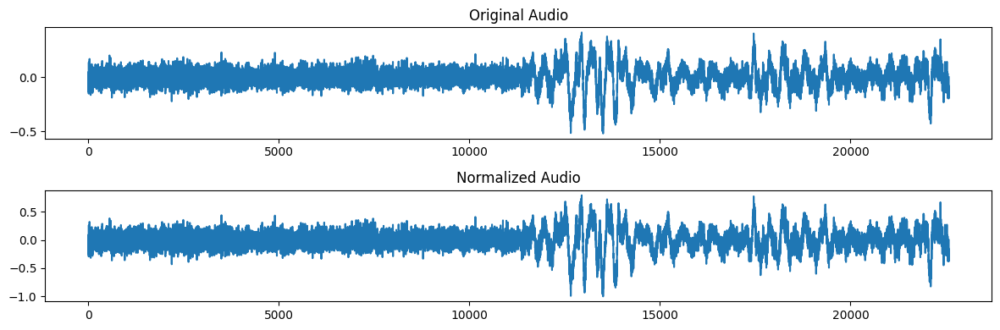

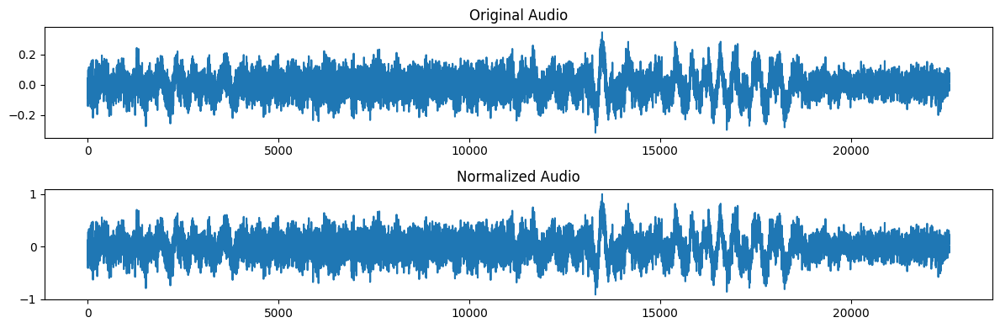

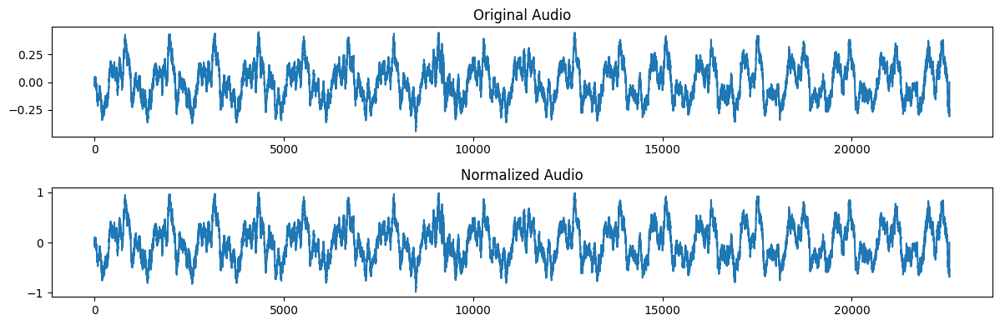

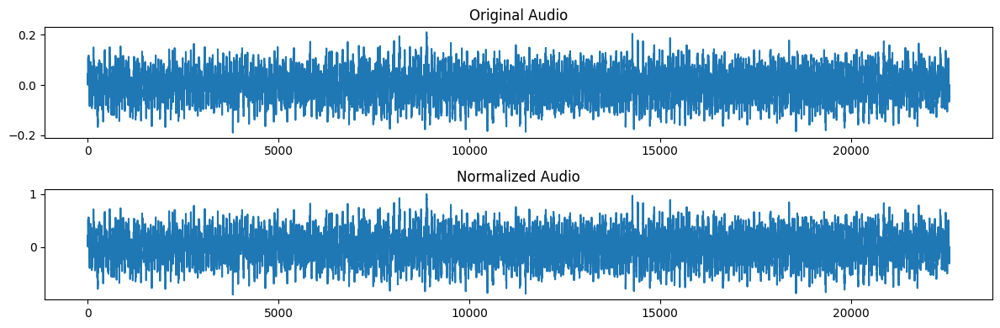

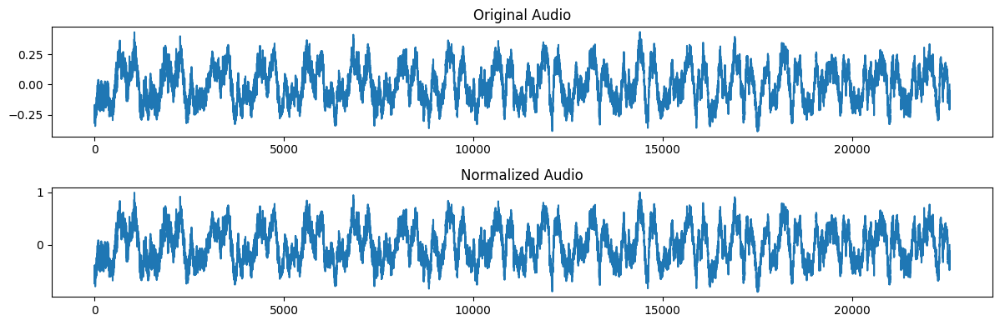

...

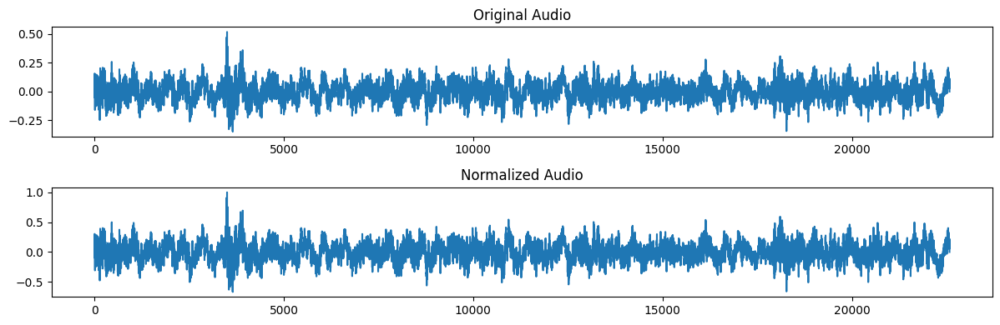

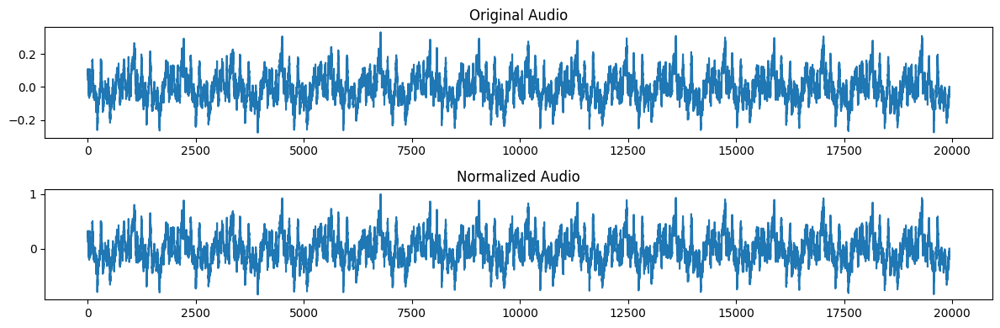

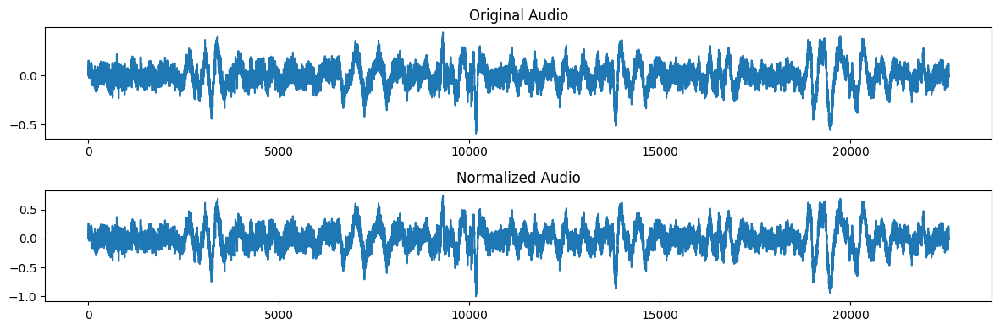

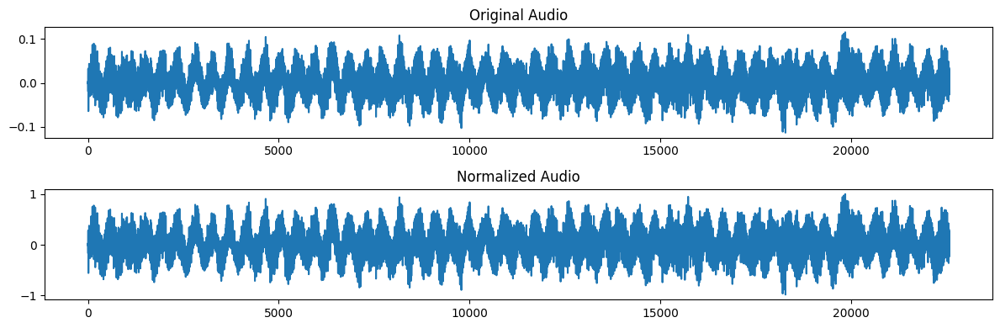

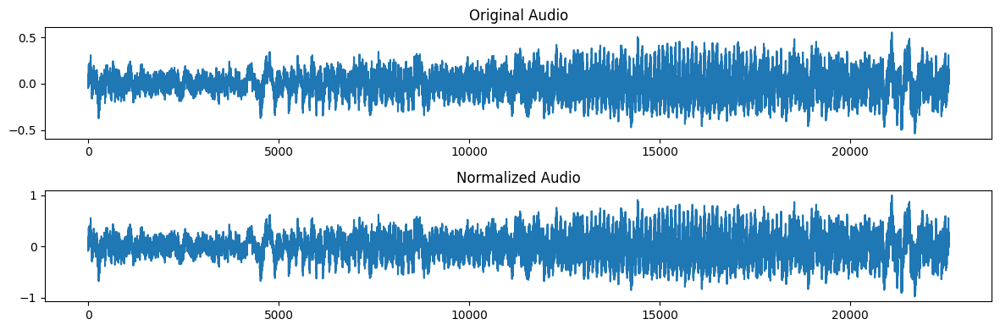

In [ ]:
import os
import librosa
import matplotlib.pyplot as plt

audio_dir = '/content/sample_data/repo/Binary_Drone_Audio/yes_drone'

# Get the list of audio files in the directory
audio_files = [os.path.join(audio_dir, file) for file in os.listdir(audio_dir) if file.endswith('.wav')]

# Filter out the files that are not present
existing_audio_files = []
for audio_file in audio_files:
    if os.path.isfile(audio_file):
        existing_audio_files.append(audio_file)

# Process each existing audio file and plot the output
for audio_file in existing_audio_files:
    # Load the audio file
    audio, sr = librosa.load(audio_file)

    # Perform peak normalization on the audio file
    normalized_audio = audio / max(abs(audio))

    # Plot the original audio
    plt.figure(figsize=(12, 4))
    plt.subplot(2, 1, 1)
    plt.plot(audio)
    plt.title('Original Audio')

    # Plot the normalized audio
    plt.subplot(2, 1, 2)
    plt.plot(normalized_audio)
    plt.title('Normalized Audio')

    # Show the plot
    plt.tight_layout()
    plt.show()


In [ ]:
import os
import librosa
import matplotlib.pyplot as plt
audio_dir = '/content/sample_data/repo/Binary_Drone_Audio/yes_drone'
existing_audio_files = []
for audio_file in audio_files:
    if os.path.isfile(audio_file):
        existing_audio_files.append(audio_file)
data = []

for audio_file in existing_audio_files:
    # Load the audio file
    audio, sr = librosa.load(audio_file)

    # Perform peak normalization on the audio file
    normalized_audio = audio / max(abs(audio))

    # # Plot the original audio
    # plt.figure(figsize=(12, 4))
    # plt.subplot(2, 1, 1)
    # plt.plot(audio)
    # plt.title('Original Audio')

    # # Plot the normalized audio
    # plt.subplot(2, 1, 2)
    # plt.plot(normalized_audio)
    # plt.title('Normalized Audio')

    # Save the data to the list
    data.append({
        'Audio File': audio_file,
        'Sample Rate': sr,
        'Duration': librosa.get_duration(audio),
        'Max Amplitude': max(abs(audio)),
        'Average Amplitude': sum(abs(audio))/len(audio)
    })

# Create a CSV file with the collected data
csv_filename = '/content/sample_data/audio_data.csv'
with open(csv_filename, 'w') as file:
    # Write the header
    file.write('Audio File,Sample Rate,Duration,Max Amplitude,Average Amplitude\n')

    # Write the data rows
    for item in data:
        file.write(f"{item['Audio File']},{item['Sample Rate']},{item['Duration']},{item['Max Amplitude']},{item['Average Amplitude']}\n")


TypeError: ignored

In [ ]:
import os
import librosa
import numpy as np

def normalize_audio_directory(directory_path):
    # Get all audio files in the directory
    audio_files = [file for file in os.listdir(directory_path) if file.endswith('.wav')]

    # Loop through each audio file
    normalized_audios = []
    for file in audio_files:
        file_path = os.path.join(directory_path, file)

        # Load the audio file
        audio, sr = librosa.load(file_path)

        # Normalize the audio by dividing it by its maximum amplitude
        normalized_audio = audio / np.max(np.abs(audio))

        # Scale the normalized audio to a range of 0 to 1
        scaled_audio = (normalized_audio + 1) / 2

        normalized_audios.append(scaled_audio)

    return normalized_audios

# Example usage
directory_path = '/content/sample_data/repo/Binary_Drone_Audio/yes_drone'
normalized_audios = normalize_audio_directory(directory_path)
print(normalized_audios)


[array([0.59854853, 0.48514375, 0.3953187 , ..., 0.41222048, 0.45803276,
       0.5       ], dtype=float32), array([0.36036468, 0.3264799 , 0.38040447, ..., 0.7136988 , 0.773419  ,
       0.5       ], dtype=float32), array([0.43263525, 0.40361625, 0.38551885, ..., 0.6422208 , 0.6042712 ,
       0.5       ], dtype=float32), array([0.13510406, 0.08744061, 0.12421173, ..., 0.42397672, 0.4506417 ,
       0.5       ], dtype=float32), array([0.59312326, 0.4591328 , 0.477677  , ..., 0.4760365 , 0.44302616,
       0.5       ], dtype=float32), array([0.46106088, 0.45947346, 0.47174412, ..., 0.157935  , 0.24998757,
       0.5       ], dtype=float32), array([0.540009  , 0.5076479 , 0.56378555, ..., 0.46283346, 0.4611881 ,
       0.5       ], dtype=float32), array([0.5142353 , 0.5342171 , 0.49183226, ..., 0.51910484, 0.49937788,
       0.5       ], dtype=float32), array([0.50673455, 0.5440564 , 0.5875291 , ..., 0.5223617 , 0.50221497,
       0.5       ], dtype=float32), array([0.4270488 , 0.450568

In [ ]:
import os
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Directory containing audio files
directory = "/content/sample_data/repo/Binary_Drone_Audio/yes_drone"

# Iterate over each file in the directory
for filename in os.listdir(directory):
    if filename.endswith(".wav"):
        # Step 1: Load the audio file
        audio_path = os.path.join(directory, filename)
        audio, sr = librosa.load(audio_path)

        # Step 2: Apply peak normalization
        normalized_audio = librosa.util.normalize(audio)

        # Step 3: Compute the spectrogram of the normalized audio
        spectrogram = librosa.feature.melspectrogram(y=normalized_audio, sr=sr)

        # Plotting the results
        plt.figure(figsize=(10, 8))

        # Plotting the audio waveform with peak normalization
        plt.subplot(2, 1, 1)
        plt.plot(np.arange(len(normalized_audio)) / sr, normalized_audio)
        plt.title("Normalized Audio")
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")

        # Plotting the spectrogram
        plt.subplot(2, 1, 2)
        librosa.display.specshow(librosa.power_to_db(spectrogram, ref=np.max),
                                 x_axis='time',
                                 y_axis='mel',
                                 sr=sr)
        plt.colorbar(format='%+2.0f dB')
        plt.title("Spectrogram of Normalized Audio")
        plt.xlabel("Time (s)")
        plt.ylabel("Mel Frequency")

        plt.tight_layout()
        plt.savefig(os.path.join(directory, f"{filename}_spectrogram.png"))
        plt.close()


In [ ]:
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Load the scaled features from the CSV file
scaled_features_file = '/content/sample_data/normalized_mfcc.csv'
scaled_mfcc = pd.read_csv(scaled_features_file).values

# Convert the values to numeric format
scaled_mfcc = pd.to_numeric(scaled_mfcc.flatten(), errors='coerce')

# Find the maximum value in the scaled feature matrix (handling NaN values)
max_value = np.nanmax(scaled_mfcc)

# Define the target peak value
target_peak = 1.0

# Perform peak normalization by dividing all values by the maximum value
normalized_mfcc = scaled_mfcc / max_value * target_peak

# Continue with further processing or analysis steps using the normalized features
# ...


<ipython-input-107-0f56da3c0116>:14: RuntimeWarning: All-NaN slice encountered
  max_value = np.nanmax(scaled_mfcc)


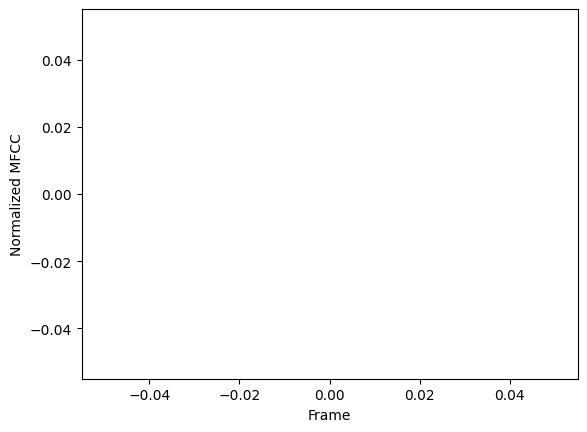

Saved normalized features to /content/sample_data/normalized_mfcc.csv


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assume normalized_mfcc is a 2-dimensional array

# Flatten the normalized_mfcc array to 1-dimension
normalized_mfcc_flat = normalized_mfcc.flatten()

# Plot the flattened array
plt.plot(normalized_mfcc_flat)
plt.xlabel('Frame')
plt.ylabel('Normalized MFCC')
plt.show()


# Example 3: Save the normalized features to a new CSV file
output_file = '/content/sample_data/normalized_mfcc.csv'
pd.DataFrame(normalized_mfcc.reshape(normalized_mfcc.shape[0], -1)).to_csv(output_file, index=False)
print(f"Saved normalized features to {output_file}")



In [ ]:
import numpy as np
import pandas as pd

# Read the normalized data from the CSV file
input_file = '/content/sample_data/normalized_mfcc.csv'
normalized_mfcc_flat = pd.read_csv(input_file).values.flatten()

# Determine the shape of the desired 2D array
num_frames = 2  # Specify the desired number of frames
num_features = len(normalized_mfcc_flat) // num_frames  # Calculate the number of features per frame

# Reshape the 1D array to a 2D array
normalized_mfcc_2d = normalized_mfcc_flat.reshape(num_frames, num_features)

print(normalized_mfcc_2d)


[[       nan        nan        nan ... 0.01463869 0.         0.01463869]
 [       nan        nan        nan ... 0.20540948 0.         0.20540948]]


In [ ]:
import numpy as np
# Import the necessary libraries for classification
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Split the data into training and testing sets
X = df_final  # Features


# Assuming you have a list of labels for each audio file
labels = []

# Convert labels to a NumPy array
labels_array = np.array(labels)

# Ensure the number of samples match
if len(labels_array) != df_final.shape[0]:
    raise ValueError("Number of labels does not match the number of samples.")

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df_final, labels_array, test_size=0.2, random_state=64)

# Create a decision tree classifier
classifier = DecisionTreeClassifier()

# Train the classifier
classifier.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = classifier.predict(X_test)

# Evaluate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


ValueError: ignored

In [ ]:
import os
import pandas as pd
import numpy as np
import librosa
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix

# Path to the audio directory
audio_dir = "/content/updated_csv_file.csv"
# Create a dictionary of class labels
class_dict = {
    "drone": 1,
    "not_drone": 0
}
# Number of samples to consider
samples_to_consider = 22050  # adjust as needed

def extract_features(file_path):
    try:
        audio, sample_rate = librosa.load(file_path, res_type='kaiser_fast')
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
        mfccs_scaled = np.mean(mfccs.T, axis=0)

    except Exception as e:
        print("Error encountered while parsing file: ", file_path)
        return None

    return mfccs_scaled

# Initialize empty arrays for features and labels
features, labels = [], []

# Iterate over all audio files in the directory and extract features
for root, dirs, files in os.walk(audio_dir):
    for file in files:
        if file.endswith('.wav'):
            # Get the class label for the file
            class_name = root.split('/')[-1]
            class_id = class_dict.get(class_name)
            if class_id is None:
                continue
            # Load the audio file and extract features
            file_path = os.path.join(root, file)
            features.append(extract_features(file_path))
            labels.append(class_id)

# Convert the feature and label arrays to numpy arrays
features = np.asarray(features)
labels = np.asarray(labels)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Scale the features using StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train a Support Vector Machine (SVM) model
clf = SVC(kernel='linear', C=1)
clf.fit(X_train_scaled, y_train)

# Predict labels for the test set
y_pred = clf.predict(X_test_scaled)

# Measure the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)